In [1]:

import cv2
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

In [2]:
input_video = "race_car.mp4"
source = input_video
video_cap = cv2.VideoCapture(source)
if (video_cap.isOpened()==False):
    print("Error opening video stream or file")

In [3]:
from moviepy.editor import *

input_video = "race_car.mp4"

# loading output video 
clip = VideoFileClip(input_video)
clip.ipython_display(width = 600)

Moviepy - Building video __temp__.mp4.
MoviePy - Writing audio in __temp__TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video __temp__.mp4



Moviepy - Done !
Moviepy - video ready __temp__.mp4


# Read and display video

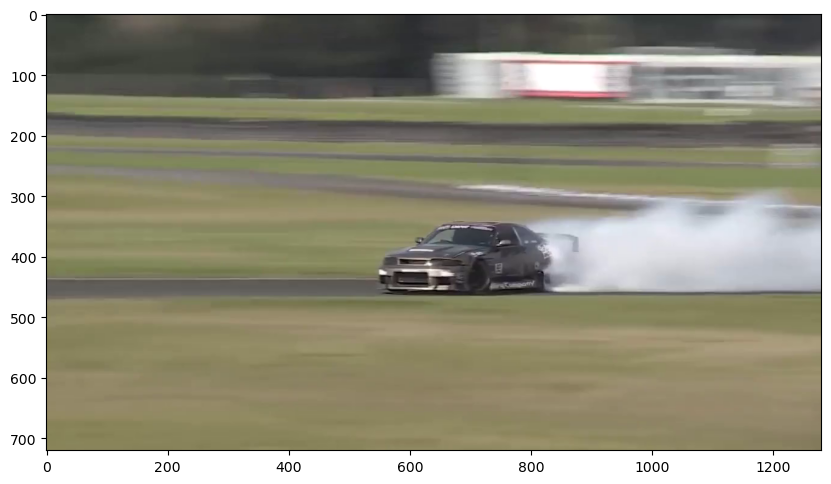

In [4]:
ret, frame = video_cap.read()
plt.figure(figsize = (10, 8))
plt.imshow(frame[...,::-1])

# Create the video writer object

In [5]:
frame_w = int(video_cap.get(cv2.CAP_PROP_FRAME_WIDTH))
frame_h = int(video_cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
frame_fps = int(video_cap.get(cv2.CAP_PROP_FPS))

fourcc_avi = cv2.VideoWriter_fourcc('M', 'J', 'P', 'G')
fourcc_mp4 = cv2.VideoWriter_fourcc(*'XVID')

file_out_avi = 'video_out.avi'
file_out_mp4 = 'video_out.mp4'

frame_fps = int(frame_fps/3)

out_avi = cv2.VideoWriter(file_out_avi, fourcc_avi, frame_fps, (frame_w, frame_h))
out_mp4 = cv2.VideoWriter(file_out_mp4, fourcc_mp4 , frame_fps, (frame_w, frame_h))

In [6]:
def drawBannerText(frame, text, banner_height_percent = 0.05, text_color = (0, 255, 0)):
    banner_height = int(banner_height_percent * frame.shape[0])
    cv2.rectangle(frame, (0, 0), (frame.shape[1], banner_height), (0, 0, 0), thickness = -1)
    
    left_offset = 20
    location = (left_offset, int( 5 + (banner_height_percent * frame.shape[0])/2 ))
    fontScale = 1.5
    fontThickness = 2
    cv2.putText(frame, text, location, cv2.FONT_HERSHEY_PLAIN, fontScale, text_color, fontThickness, cv2.LINE_AA)

In [55]:
frame_count = 0
while True:
    ok, frame = video_cap.read()
    if not ok:
        break
    
    frame_count += 1
    drawBannerText(frame, 'Frame: ' + str(int(frame_count)) + ' FPS: ' + str(int(frame_fps)))
    out_avi.write(frame)
    out_mp4.write(frame)

In [56]:
video_cap.release()
out_avi.release()
out_mp4.release()

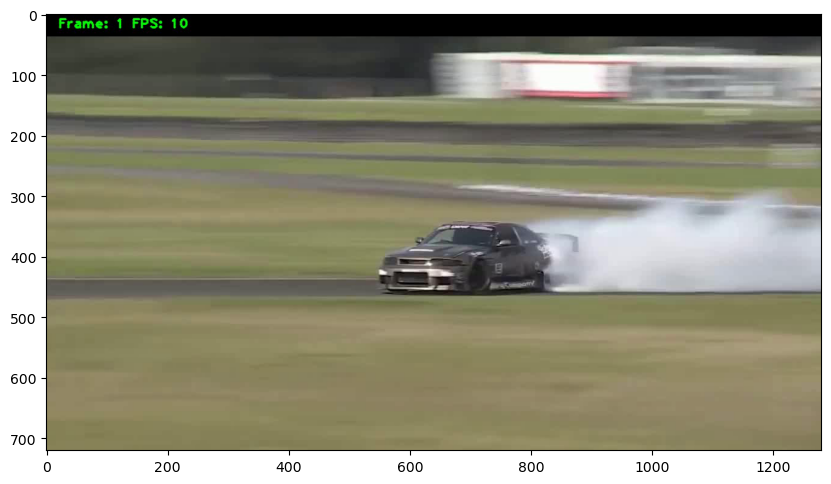

In [57]:
input_video = 'video_out.mp4'
video_cap = cv2.VideoCapture(input_video)
if not video_cap.isOpened():
    print('Unable to open: ' + input_video)
ret, frame = video_cap.read()
plt.figure(figsize = (10, 8))
plt.imshow(frame[...,::-1])  

In [63]:
from moviepy.editor import *

clip = VideoFileClip(file_out_mp4)
clip.ipython_display(width = 600)

Moviepy - Building video __temp__.mp4.
Moviepy - Writing video __temp__.mp4



Moviepy - Done !
Moviepy - video ready __temp__.mp4


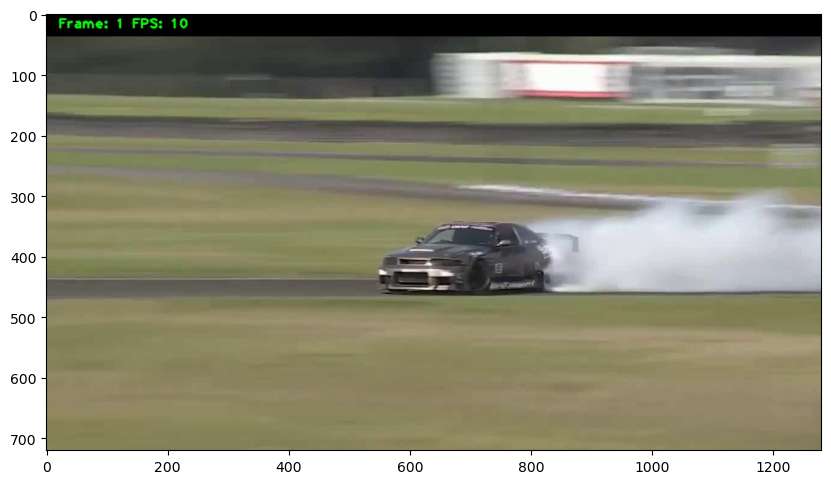

In [64]:
input_video = 'video_out.mp4'
video_cap = cv2.VideoCapture(input_video)
if not video_cap.isOpened():
    print('Unable to open: ' + input_video)
ret, frame = video_cap.read()
plt.figure(figsize = (10, 8))
plt.imshow(frame[...,::-1]) 